<a href="https://colab.research.google.com/github/TristanEkaWiranata/2025_Pengolahan-citra/blob/main/PengolahanCitra_Minggu02.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Pengolahan Citra
### Minggu 02
### Operasi Deteksi Tepi

p1. Deteksi tepi menggunakan Operator Sobel

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, color, filters

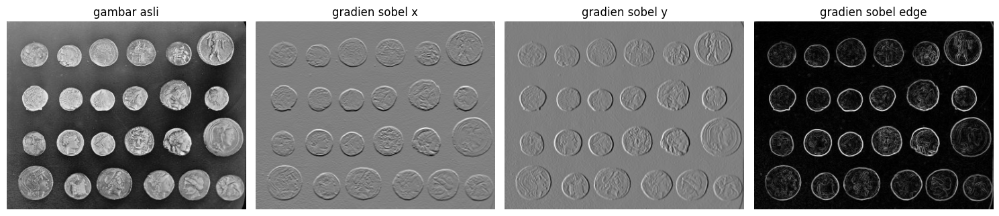

In [3]:
image = data.coins()
gray_image = color.rgb2gray(image) if image.ndim == 3 else image

sobel_x = filters.sobel_h(gray_image)
sobel_y = filters.sobel_v(gray_image)
sobel_edege = filters.sobel(gray_image)

fig, axes = plt.subplots(1,4, figsize=(15,5))
ax= axes.ravel()

ax[0].imshow(gray_image, cmap='gray')
ax[0].set_title('gambar asli')
ax[0].axis('off')

ax[1].imshow(sobel_x, cmap='gray')
ax[1].set_title('gradien sobel x')
ax[1].axis('off')

ax[2].imshow(sobel_y, cmap='gray')
ax[2].set_title('gradien sobel y')
ax[2].axis('off')

ax[3].imshow(sobel_edege, cmap='gray')
ax[3].set_title('gradien sobel edge')
ax[3].axis('off')

plt.tight_layout()
plt.show()

In [4]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, color, filters

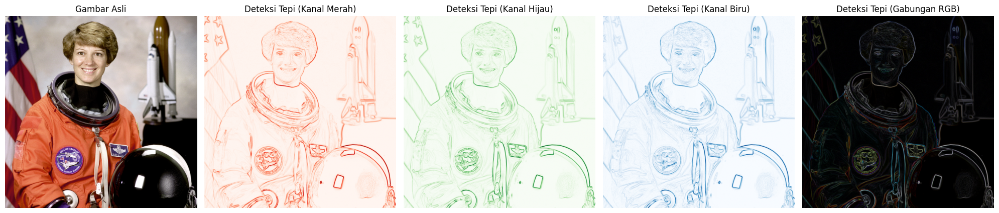

In [5]:


# Ambil gambar bawaan dari skimage (gambar astronaut berwarna)
image = data.astronaut() # Gambar berwarna bawaan dari skimage

# Pisahkan kanal warna
red_channel = image[:, :, 0] # Kanal merah
green_channel = image[:, :, 1] # Kanal hijau
blue_channel = image[:, :, 2] # Kanal biru

# Terapkan Operator Sobel pada masing-masing kanal warna
sobel_red = filters.sobel(red_channel)
sobel_green = filters.sobel(green_channel)
sobel_blue = filters.sobel(blue_channel)

# Gabungkan hasil dengan mengambil rata-rata dari ketiga kanal
sobel_color = np.stack((sobel_red, sobel_green, sobel_blue), axis=2)

# Visualisasi hasil
fig, axes = plt.subplots(1, 5, figsize=(20, 5))
ax = axes.ravel()

ax[0].imshow(image)
ax[0].set_title("Gambar Asli")
ax[0].axis("off")

ax[1].imshow(sobel_red, cmap='Reds')
ax[1].set_title("Deteksi Tepi (Kanal Merah)")
ax[1].axis("off")

ax[2].imshow(sobel_green, cmap='Greens')
ax[2].set_title("Deteksi Tepi (Kanal Hijau)")
ax[2].axis("off")

ax[3].imshow(sobel_blue, cmap='Blues')
ax[3].set_title("Deteksi Tepi (Kanal Biru)")
ax[3].axis("off")

ax[4].imshow(sobel_color)
ax[4].set_title("Deteksi Tepi (Gabungan RGB)")
ax[4].axis("off")

plt.tight_layout()
plt.show()

p2. Deteksi Tepi dengan operator Roberts

In [6]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import data

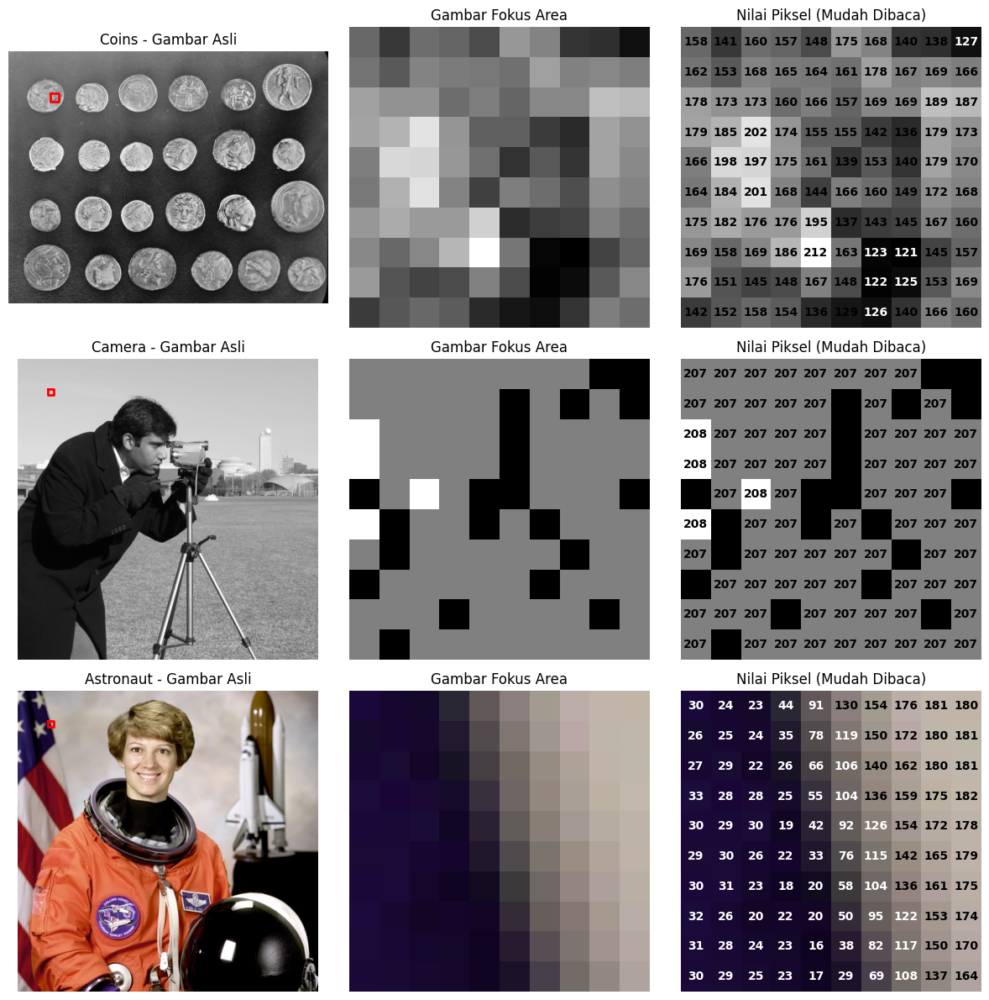

In [7]:


# Ambil gambar contoh dari skimage
gambar_coins = data.coins()  # Gambar grayscale
gambar_camera = data.camera()  # Gambar grayscale
gambar_astronaut = data.astronaut()  # Gambar RGB

# Menampilkan bagaimana citra digital tersusun dari piksel dengan area fokus yang ditandai
fig, axes = plt.subplots(3, 3, figsize=(12, 12))

# List gambar dan nama
gambar_list = [gambar_coins, gambar_camera, gambar_astronaut]
nama_list = ["Coins", "Camera", "Astronaut"]

# Koordinat area kecil yang di-zoom
x_start, x_end = 50, 60
y_start, y_end = 50, 60

for i, (img, nama) in enumerate(zip(gambar_list, nama_list)):
    # Gambar asli
    axes[i, 0].imshow(img, cmap='gray' if len(img.shape) == 2 else None)
    axes[i, 0].set_title(f"{nama} - Gambar Asli")
    axes[i, 0].axis('off')

    # Tambahkan kotak merah untuk menunjukkan area yang difokuskan
    rect_x = [x_start, x_end, x_end, x_start, x_start]
    rect_y = [y_start, y_start, y_end, y_end, y_start]
    axes[i, 0].plot(rect_x, rect_y, color="red", linewidth=2)

    # Gambar fokus area
    zoomed_img = img[y_start:y_end, x_start:x_end]
    axes[i, 1].imshow(zoomed_img, cmap='gray' if len(img.shape) == 2 else None, interpolation='nearest')
    axes[i, 1].set_title("Gambar Fokus Area")
    axes[i, 1].axis('off')

    # Menampilkan nilai piksel dalam area yang di-zoom (khusus RGB, gunakan rata-rata kanal)
    axes[i, 2].imshow(zoomed_img, cmap='gray' if len(img.shape) == 2 else None, interpolation='nearest')

    for y in range(zoomed_img.shape[0]):
        for x in range(zoomed_img.shape[1]):
            if len(img.shape) == 3:  # Jika RGB, ambil nilai rata-rata piksel untuk tampilan angka
                pixel_value = np.mean(zoomed_img[y, x]).astype(int)
            else:
                pixel_value = zoomed_img[y, x]

            # Pilih warna teks agar mudah dibaca di latar belakang
            text_color = "white" if pixel_value < 128 else "black"
            axes[i, 2].text(x, y, str(pixel_value), color=text_color, ha='center', va='center', fontsize=10, fontweight='bold')

    axes[i, 2].set_title("Nilai Piksel (Mudah Dibaca)")
    axes[i, 2].axis('off')

plt.tight_layout()
plt.show()

p.3 Perbandingan deteksi tepi dengan beberapa operator (Sobel, Roberts,
Prewitt, Kirsch, dan Canny) pada citra grayscale

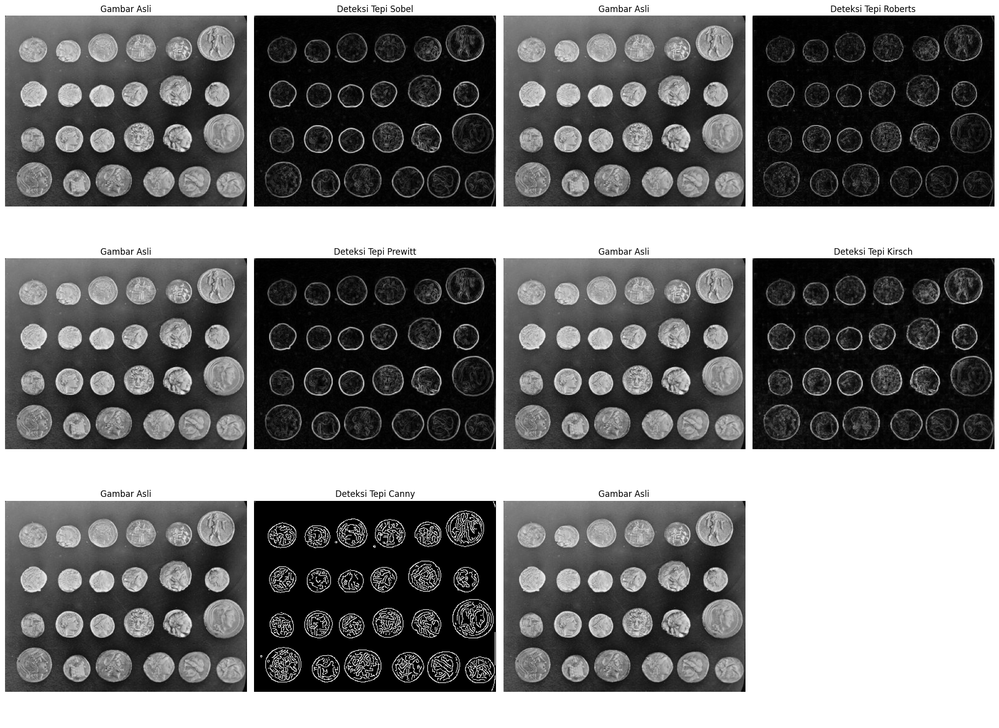

In [8]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, color, filters, feature
from skimage.filters.rank import gradient
from skimage.morphology import disk

# ===================== 1 AMBIL GAMBAR GRAYSCALE =====================
# Menggunakan gambar koin dari skimage
image_gray = data.coins()  # Gambar grayscale

# ===================== 2 TERAPKAN BERBAGAI OPERATOR DETEKSI TEPI =====================

# Operator Sobel
sobel_edge = filters.sobel(image_gray)

# Operator Roberts
roberts_edge = filters.roberts(image_gray)

# Operator Prewitt
prewitt_edge = filters.prewitt(image_gray)

# Operator Kirsch (Menggunakan filter gradien berbasis morfologi)
kirsch_edge = gradient(image_gray, disk(1))

# Operator Canny
canny_edge = feature.canny(image_gray, sigma=1)

# ===================== 3 VISUALISASI HASIL (FORMAT 4 KOLOM, 3 BARIS) =====================

fig, axes = plt.subplots(3, 4, figsize=(20, 15))
ax = axes.ravel()

# Baris 1: Gambar Asli - Sobel
ax[0].imshow(image_gray, cmap='gray')
ax[0].set_title("Gambar Asli")
ax[0].axis("off")

ax[1].imshow(sobel_edge, cmap='gray')
ax[1].set_title("Deteksi Tepi Sobel")
ax[1].axis("off")

ax[2].imshow(image_gray, cmap='gray')
ax[2].set_title("Gambar Asli")
ax[2].axis("off")

ax[3].imshow(roberts_edge, cmap='gray')
ax[3].set_title("Deteksi Tepi Roberts")
ax[3].axis("off")

# Baris 2: Gambar Asli - Prewitt
ax[4].imshow(image_gray, cmap='gray')
ax[4].set_title("Gambar Asli")
ax[4].axis("off")

ax[5].imshow(prewitt_edge, cmap='gray')
ax[5].set_title("Deteksi Tepi Prewitt")
ax[5].axis("off")

ax[6].imshow(image_gray, cmap='gray')
ax[6].set_title("Gambar Asli")
ax[6].axis("off")

ax[7].imshow(kirsch_edge, cmap='gray')
ax[7].set_title("Deteksi Tepi Kirsch")
ax[7].axis("off")

# Baris 3: Gambar Asli - Canny
ax[8].imshow(image_gray, cmap='gray')
ax[8].set_title("Gambar Asli")
ax[8].axis("off")

ax[9].imshow(canny_edge, cmap='gray')
ax[9].set_title("Deteksi Tepi Canny")
ax[9].axis("off")

ax[10].imshow(image_gray, cmap='gray')
ax[10].set_title("Gambar Asli")
ax[10].axis("off")

# Kosongkan posisi terakhir agar tampilan rapi
ax[11].axis("off")

plt.tight_layout()
plt.show()

p.4 Perbandingan deteksi tepi dengan beberapa operator (Sobel, Roberts,
Prewitt, Kirsch, dan Canny) pada citra

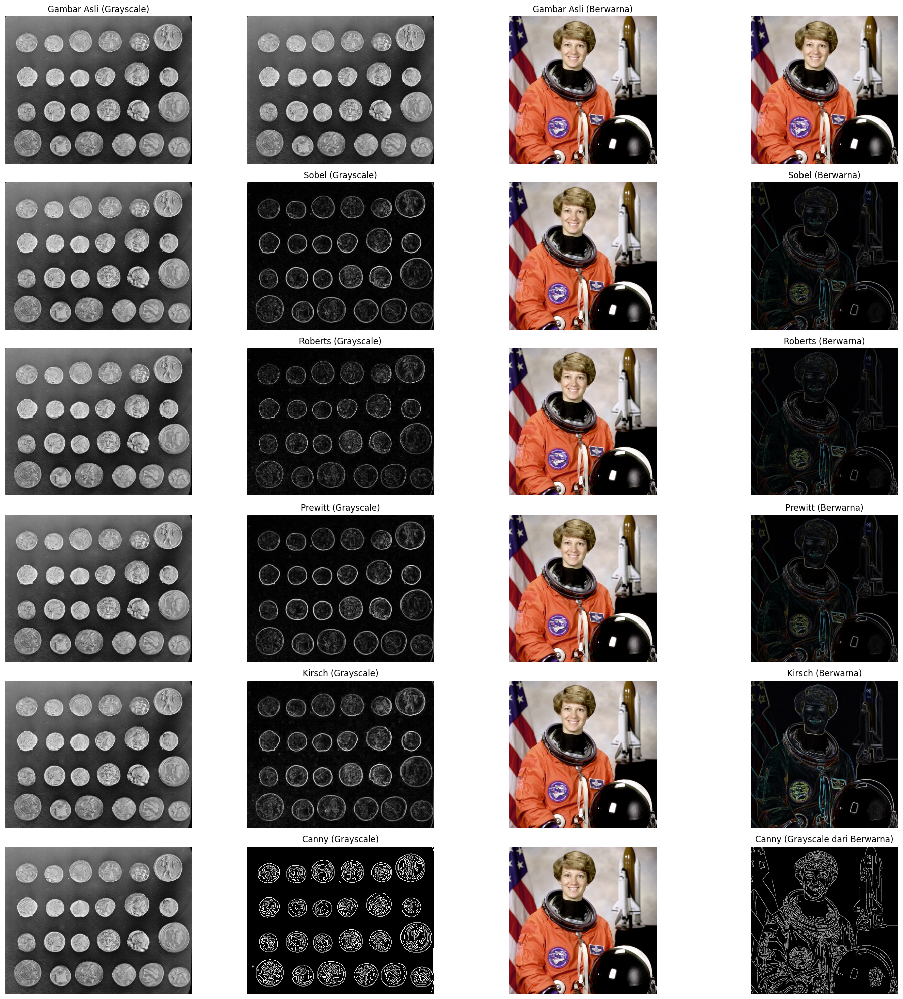

In [10]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, filters, feature, color
from skimage.filters.rank import gradient
from skimage.morphology import disk

# ===================== 1 AMBIL GAMBAR GRAYSCALE & BERWARNA =====================
# Menggunakan gambar bawaan dari skimage
image_gray = data.coins()  # Gambar grayscale
image_color = data.astronaut()  # Gambar berwarna

# ===================== 2 TERAPKAN BERBAGAI OPERATOR DETEKSI TEPI =====================

# ----- Pada Gambar Grayscale -----
sobel_gray = filters.sobel(image_gray)
roberts_gray = filters.roberts(image_gray)
prewitt_gray = filters.prewitt(image_gray)
kirsch_gray = gradient(image_gray, disk(1))
canny_gray = feature.canny(image_gray, sigma=1)

# ----- Pada Gambar Berwarna (Per Kanal RGB) -----
def apply_edge_detection(image, operator):
    """Menerapkan operator deteksi tepi pada setiap kanal warna (R, G, B)."""
    red = operator(image[:, :, 0])
    green = operator(image[:, :, 1])
    blue = operator(image[:, :, 2])
    return np.stack((red, green, blue), axis=2)

sobel_color = apply_edge_detection(image_color, filters.sobel)
roberts_color = apply_edge_detection(image_color, filters.roberts)
prewitt_color = apply_edge_detection(image_color, filters.prewitt)
kirsch_color = apply_edge_detection(image_color, lambda img: gradient(img, disk(1)))
canny_color = feature.canny(color.rgb2gray(image_color), sigma=1)  # Canny hanya untuk grayscale

# ===================== 3 VISUALISASI HASIL (FORMAT 4 KOLOM, 6 BARIS) =====================

fig, axes = plt.subplots(6, 4, figsize=(20, 20))
ax = axes.ravel()

# ----- Baris 1: Gambar Asli -----
ax[0].imshow(image_gray, cmap='gray')
ax[0].set_title("Gambar Asli (Grayscale)")
ax[0].axis("off")

ax[1].imshow(image_gray, cmap='gray')  # Placeholder
ax[1].axis("off")

ax[2].imshow(image_color)
ax[2].set_title("Gambar Asli (Berwarna)")
ax[2].axis("off")

ax[3].imshow(image_color)  # Placeholder
ax[3].axis("off")

# ----- Baris 2: Sobel -----
ax[4].imshow(image_gray, cmap='gray')
ax[4].axis("off")

ax[5].imshow(sobel_gray, cmap='gray')
ax[5].set_title("Sobel (Grayscale)")
ax[5].axis("off")

ax[6].imshow(image_color)
ax[6].axis("off")

ax[7].imshow(sobel_color)
ax[7].set_title("Sobel (Berwarna)")
ax[7].axis("off")

# ----- Baris 3: Roberts -----
ax[8].imshow(image_gray, cmap='gray')
ax[8].axis("off")

ax[9].imshow(roberts_gray, cmap='gray')
ax[9].set_title("Roberts (Grayscale)")
ax[9].axis("off")

ax[10].imshow(image_color)
ax[10].axis("off")

ax[11].imshow(roberts_color)
ax[11].set_title("Roberts (Berwarna)")
ax[11].axis("off")

# ----- Baris 4: Prewitt -----
ax[12].imshow(image_gray, cmap='gray')
ax[12].axis("off")

ax[13].imshow(prewitt_gray, cmap='gray')
ax[13].set_title("Prewitt (Grayscale)")
ax[13].axis("off")

ax[14].imshow(image_color)
ax[14].axis("off")

ax[15].imshow(prewitt_color)
ax[15].set_title("Prewitt (Berwarna)")
ax[15].axis("off")

# ----- Baris 5: Kirsch -----
ax[16].imshow(image_gray, cmap='gray')
ax[16].axis("off")

ax[17].imshow(kirsch_gray, cmap='gray')
ax[17].set_title("Kirsch (Grayscale)")
ax[17].axis("off")

ax[18].imshow(image_color)
ax[18].axis("off")

ax[19].imshow(kirsch_color)
ax[19].set_title("Kirsch (Berwarna)")
ax[19].axis("off")

# ----- Baris 6: Canny -----
ax[20].imshow(image_gray, cmap='gray')
ax[20].axis("off")

ax[21].imshow(canny_gray, cmap='gray')
ax[21].set_title("Canny (Grayscale)")
ax[21].axis("off")

ax[22].imshow(image_color)
ax[22].axis("off")

ax[23].imshow(canny_color, cmap='gray')
ax[23].set_title("Canny (Grayscale dari Berwarna)")
ax[23].axis("off")

plt.tight_layout()
plt.show()

TUGAS - Buat program untuk melakukan perbandingan deteksi tepi dari beberapa operator

menggunakan gambar yang kalian dapat dari handphone masing-masing

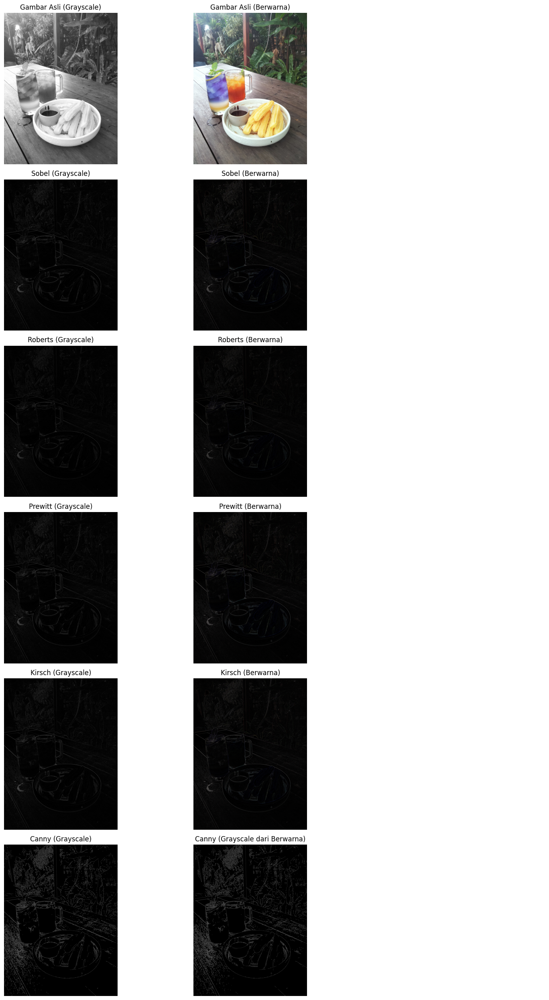

In [13]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import filters, feature, color, io
from skimage.filters.rank import gradient
from skimage.morphology import disk

# ===================== 1. LOAD GAMBAR =====================
image_color = io.imread('foto-makanan.jpeg')  # Gambar asli (berwarna)
image_gray = color.rgb2gray(image_color)      # Ubah ke grayscale

# ===================== 2. DETEKSI TEPI =====================
# ----- Grayscale -----
sobel_gray = filters.sobel(image_gray)
roberts_gray = filters.roberts(image_gray)
prewitt_gray = filters.prewitt(image_gray)
kirsch_gray = gradient((image_gray * 255).astype(np.uint8), disk(1))
canny_gray = feature.canny(image_gray, sigma=1)

# ----- Berwarna (per kanal + normalisasi) -----
def apply_edge_detection(image, operator):
    red = operator(image[:, :, 0])
    green = operator(image[:, :, 1])
    blue = operator(image[:, :, 2])

    # Normalisasi ke 0-1
    red_norm = (red - red.min()) / (red.max() - red.min() + 1e-8)
    green_norm = (green - green.min()) / (green.max() - green.min() + 1e-8)
    blue_norm = (blue - blue.min()) / (blue.max() - blue.min() + 1e-8)

    return np.stack((red_norm, green_norm, blue_norm), axis=2)

sobel_color = apply_edge_detection(image_color, filters.sobel)
roberts_color = apply_edge_detection(image_color, filters.roberts)
prewitt_color = apply_edge_detection(image_color, filters.prewitt)
kirsch_color = apply_edge_detection(image_color, lambda img: gradient(img, disk(1)))
canny_color = feature.canny(image_gray, sigma=1)  # tetap grayscale

# ===================== 3. VISUALISASI =====================
fig, axes = plt.subplots(6, 3, figsize=(15, 25))
ax = axes.ravel()

# Baris 1: Gambar Asli
ax[0].imshow(image_gray, cmap='gray')
ax[0].set_title("Gambar Asli (Grayscale)")
ax[0].axis("off")

ax[1].imshow(image_color)
ax[1].set_title("Gambar Asli (Berwarna)")
ax[1].axis("off")

ax[2].axis("off")  # Kosong

# Baris 2: Sobel
ax[3].imshow(sobel_gray, cmap='gray')
ax[3].set_title("Sobel (Grayscale)")
ax[3].axis("off")

ax[4].imshow(sobel_color)
ax[4].set_title("Sobel (Berwarna)")
ax[4].axis("off")

ax[5].axis("off")

# Baris 3: Roberts
ax[6].imshow(roberts_gray, cmap='gray')
ax[6].set_title("Roberts (Grayscale)")
ax[6].axis("off")

ax[7].imshow(roberts_color)
ax[7].set_title("Roberts (Berwarna)")
ax[7].axis("off")

ax[8].axis("off")

# Baris 4: Prewitt
ax[9].imshow(prewitt_gray, cmap='gray')
ax[9].set_title("Prewitt (Grayscale)")
ax[9].axis("off")

ax[10].imshow(prewitt_color)
ax[10].set_title("Prewitt (Berwarna)")
ax[10].axis("off")

ax[11].axis("off")

# Baris 5: Kirsch
ax[12].imshow(kirsch_gray, cmap='gray')
ax[12].set_title("Kirsch (Grayscale)")
ax[12].axis("off")

ax[13].imshow(kirsch_color)
ax[13].set_title("Kirsch (Berwarna)")
ax[13].axis("off")

ax[14].axis("off")

# Baris 6: Canny
ax[15].imshow(canny_gray, cmap='gray')
ax[15].set_title("Canny (Grayscale)")
ax[15].axis("off")

ax[16].imshow(canny_color, cmap='gray')
ax[16].set_title("Canny (Grayscale dari Berwarna)")
ax[16].axis("off")

ax[17].axis("off")

plt.tight_layout()
plt.show()
